In [1]:
import warnings
warnings.filterwarnings(action="ignore")

import os
import numpy as np
import pandas as pd
from pyts.image import RecurrencePlot
from PIL import Image 
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [2]:
def chunkify(df: pd.DataFrame, chunk_size: int, stride: int = 1):
    start = 0
    length = df.shape[0]

    # If DF is smaller than the chunk, return the DF
    if length <= chunk_size:
        return df[:]

    # Producing individual chunks
    dfs = []
    # while start + chunk_size <= length:
    #     dfs.append(df[start:chunk_size + start])
    #     start = start + chunk_size
    for i in range(0, length - chunk_size, stride):
        dfs.append(df[i:i + chunk_size])
    return dfs

In [3]:
df_rp_param_results = pd.read_csv('../data/results_rp_params_v3.csv')

In [4]:
# Seleção das linhas com o menor valor de c_ent_div_psvp para cada predictor
df_results = df_rp_param_results.loc[df_rp_param_results.groupby('predictor')['c_ent_div_psvp'].idxmin()]

In [5]:
df_results.head()

,predictor,windows_size,optimal_delay,optimal_embedding,rr,c_ent_div_psvp,c_ent_mul_psvp,c_1_div_2_to_ent_div_psvp,c_1_div_2_to_ent_mul_psvp,c_ent,c_psvp
131,all,896,NaN,NaN,NaN,0.446576,0.332703,189.146057,0.509769,0.374970,0.710810
65,amplitude_spectrum,1792,886.0,2.0,0.1,0.486426,0.465574,0.735138,0.703380,0.475880,0.978215
0,mains,28,1.0,1.0,0.1,0.321580,0.142154,18.063820,0.191129,0.209785,0.272556
100,phase_spectrum,1792,876.0,2.0,0.1,0.481314,0.458899,0.739431,0.704991,0.469969,0.976442


In [6]:
# Calcular o MMC dos valores na coluna windows_size
window_sizes = df_results['windows_size'].values

In [7]:
df_active_binary = pd.read_csv('../data/redd_active_binary_f1hz_w_ftt.csv')
df_active_value = pd.read_csv('../data/redd_active_value_f1hz_w_ftt.csv')
attributes = [c for c in df_active_binary.columns.values if not c in ['timestamp']]
labels = [c for c in df_active_binary.columns.values if not c in ['timestamp', 'mains', 'amplitude_spectrum', 'phase_spectrum']]
#labels = ['Fridge01','Dish washer01','Microwave01','Washer dryer01','Washer dryer02']
predictors = ['mains', 'amplitude_spectrum', 'phase_spectrum']
index_name = 'timestamp'
training_start = '2011-04-16'
training_end = '2011-05-16'
test_start = '2011-05-17'
test_end = '2011-05-31'

# Ensure 'timestamp' column is in datetime format
df_active_binary[index_name] = pd.to_datetime(df_active_binary[index_name])
# Set the index as the timestamp
df_active_binary.set_index(index_name, inplace=True)

# Ensure 'timestamp' column is in datetime format
df_active_value[index_name] = pd.to_datetime(df_active_value[index_name])
# Set the index as the timestamp
df_active_value.set_index(index_name, inplace=True)

In [8]:
windows_size_mmc = np.lcm.reduce(window_sizes)
windows_size_min = 28

In [9]:
#df_results_mmc = df_rp_param_results.loc[df_rp_param_results[df_rp_param_results['windows_size']==windows_size_mmc].groupby('predictor')['c_ent_div_psvp'].idxmin()]

In [10]:
df_results_min = df_rp_param_results.loc[df_rp_param_results[df_rp_param_results['windows_size']==windows_size_min].groupby('predictor')['c_ent_div_psvp'].idxmin()]

In [11]:
#df_results_mmc

In [12]:
df_results_min

,predictor,windows_size,optimal_delay,optimal_embedding,rr,c_ent_div_psvp,c_ent_mul_psvp,c_1_div_2_to_ent_div_psvp,c_1_div_2_to_ent_mul_psvp,c_ent,c_psvp
126,all,28,NaN,NaN,NaN,0.628163,0.330816,6.489058,0.399908,0.448257,0.596246
35,amplitude_spectrum,28,5.0,2.0,0.1,0.686343,0.490452,0.793100,0.568912,0.578491,0.848970
0,mains,28,1.0,1.0,0.1,0.321580,0.142154,18.063820,0.191129,0.209785,0.272556
70,phase_spectrum,28,5.0,1.0,0.1,0.876564,0.359841,1.071190,0.439682,0.556494,0.646617


In [13]:
scaler = StandardScaler()
# Partition the DataFrame into training and test sets
training_active_value_set = df_active_value.loc[training_start:training_end]
training_active_value_set[predictors] = scaler.fit_transform(training_active_value_set[predictors])

training_active_binary_set = df_active_binary.loc[training_start:training_end]
training_active_binary_set[predictors] = scaler.fit_transform(training_active_binary_set[predictors])

#data_value_train_mmc = {}
#for a in labels: # type: ignore
#    p = predictors.copy()
#    p.append(a)
#    data_value_train_mmc[a] = chunkify(
#            training_active_value_set[p], # type: ignore
#            windows_size_mmc,
#            windows_size_mmc
#        )

#data_binary_train_mmc = {}
#for a in labels: # type: ignore
#    p = predictors.copy()
#    p.append(a)
#    data_binary_train_mmc[a] = chunkify(
#            training_active_binary_set[p], # type: ignore
#            windows_size_mmc,
#            windows_size_mmc
#        )

data_value_train_min = {}
for a in labels: # type: ignore
    p = predictors.copy()
    p.append(a)
    data_value_train_min[a] = chunkify(
            training_active_value_set[p], # type: ignore
            windows_size_min,
            windows_size_min
        )

data_binary_train_min = {}
for a in labels: # type: ignore
    p = predictors.copy()
    p.append(a)
    data_binary_train_min[a] = chunkify(
            training_active_binary_set[p], # type: ignore
            windows_size_min,
            windows_size_min
        )

test_active_value_set = df_active_value.loc[test_start:test_end]
test_active_value_set[predictors] = scaler.transform(test_active_value_set[predictors])

test_active_binary_set = df_active_binary.loc[test_start:test_end]
test_active_binary_set[predictors] = scaler.transform(test_active_binary_set[predictors])

#data_value_test_mmc = {}
#for a in labels: # type: ignore
#    p = predictors.copy()
#    p.append(a)
#    data_value_test_mmc[a] = chunkify(
#            test_active_value_set[p], # type: ignore
#            windows_size_mmc,
#            windows_size_mmc
#        )
    
#data_binary_test_mmc = {}
#for a in labels: # type: ignore
#    p = predictors.copy()
#    p.append(a)
#    data_binary_test_mmc[a] = chunkify(
#            test_active_value_set[p], # type: ignore
#            windows_size_mmc,
#            windows_size_mmc
#        )
    
data_value_test_min = {}
for a in labels: # type: ignore
    p = predictors.copy()
    p.append(a)
    data_value_test_min[a] = chunkify(
            test_active_value_set[p], # type: ignore
            windows_size_min,
            windows_size_min
        )
    
data_binary_test_min = {}
for a in labels: # type: ignore
    p = predictors.copy()
    p.append(a)
    data_binary_test_min[a] = chunkify(
            test_active_value_set[p], # type: ignore
            windows_size_min,
            windows_size_min
        )

In [14]:
df_appliance_threshold = pd.read_csv('../data/appliance_threshold.csv')
appliance_threshold = df_appliance_threshold.set_index('appliance')['threshold'].to_dict()

#train_value_mmc_label_list = list()
#for i in range(len(data_value_train_mmc[labels[0]])):
#    row_label = dict()
#    row_label['row'] = i
#    for a in labels:
#        if np.mean(data_value_train_mmc[a][i][a]) >= appliance_threshold[a]:
#            row_label[a] = 1
#        else:  
#            row_label[a] = 0
#    train_value_mmc_label_list.append(row_label)
#test_value_mmc_label_list = list()
#for i in range(len(data_value_test_mmc[labels[0]])):
#    row_label = dict()
#    row_label['row'] = i
#    for a in labels:
#        if np.mean(data_value_test_mmc[a][i][a]) >= appliance_threshold[a]:
#            row_label[a] = 1
#        else:  
#            row_label[a] = 0
#    test_value_mmc_label_list.append(row_label)

#train_binary_mmc_label_list = list()
#for i in range(len(data_binary_train_mmc[labels[0]])):
#    row_label = dict()
#    row_label['row'] = i
#    for a in labels:
#        row_label[a] = np.median(data_binary_train_mmc[a][i][a])
#    train_binary_mmc_label_list.append(row_label)
#test_binary_mmc_label_list = list()
#for i in range(len(data_binary_test_mmc[labels[0]])):
#    row_label = dict()
#    row_label['row'] = i
#    for a in labels:
#        row_label[a] = np.median(data_binary_test_mmc[a][i][a])
#    test_binary_mmc_label_list.append(row_label)

train_value_min_label_list = list()
for i in range(len(data_value_train_min[labels[0]])):
    row_label = dict()
    row_label['row'] = i
    for a in labels:
        if np.mean(data_value_train_min[a][i][a]) >= appliance_threshold[a]:
            row_label[a] = 1
        else:  
            row_label[a] = 0
    train_value_min_label_list.append(row_label)
test_value_min_label_list = list()
for i in range(len(data_value_test_min[labels[0]])):
    row_label = dict()
    row_label['row'] = i
    for a in labels:
        if np.mean(data_value_test_min[a][i][a]) >= appliance_threshold[a]:
            row_label[a] = 1
        else:  
            row_label[a] = 0
    test_value_min_label_list.append(row_label)

train_binary_min_label_list = list()
for i in range(len(data_binary_train_min[labels[0]])):
    row_label = dict()
    row_label['row'] = i
    for a in labels:
        row_label[a] = np.median(data_binary_train_min[a][i][a])
    train_binary_min_label_list.append(row_label)
test_binary_min_label_list = list()
for i in range(len(data_binary_test_min[labels[0]])):
    row_label = dict()
    row_label['row'] = i
    for a in labels:
        row_label[a] = np.median(data_binary_test_min[a][i][a])
    test_binary_min_label_list.append(row_label)


#train_value_mmc_label_list = pd.DataFrame(train_value_mmc_label_list)
#test_value_mmc_label_list = pd.DataFrame(test_value_mmc_label_list) 
#train_binary_mmc_label_list = pd.DataFrame(train_binary_mmc_label_list)
#test_binary_mmc_label_list = pd.DataFrame(test_binary_mmc_label_list) 

train_value_min_label_list = pd.DataFrame(train_value_min_label_list)
test_value_min_label_list = pd.DataFrame(test_value_min_label_list) 
train_binary_min_label_list = pd.DataFrame(train_binary_min_label_list)
test_binary_min_label_list = pd.DataFrame(test_binary_min_label_list) 

#train_value_mmc_label_list.to_csv(f'../data/train_value_mmc_label_windows_{windows_size_mmc}.csv', index=False)
#test_value_mmc_label_list.to_csv(f'../data/test_value_mmc_label_windows_{windows_size_mmc}.csv', index=False)
#train_binary_mmc_label_list.to_csv(f'../data/train_binary_mmc_label_windows_{windows_size_mmc}.csv', index=False)
#test_binary_mmc_label_list.to_csv(f'../data/test_binary_mmc_label_windows_{windows_size_mmc}.csv', index=False)

train_value_min_label_list.to_csv(f'../data/train_value_min_label_windows_{windows_size_min}.csv', index=False)
test_value_min_label_list.to_csv(f'../data/test_value_min_label_windows_{windows_size_min}.csv', index=False)
train_binary_min_label_list.to_csv(f'../data/train_binary_min_label_windows_{windows_size_min}.csv', index=False)
test_binary_min_label_list.to_csv(f'../data/test_binary_min_label_windows_{windows_size_min}.csv', index=False)

In [15]:
#train_value_mmc_label_list = pd.read_csv(f'../data/train_value_mmc_label_windows_{windows_size_mmc}.csv')
#test_value_mmc_label_list = pd.read_csv(f'../data/test_value_mmc_label_windows_{windows_size_mmc}.csv')
#train_binary_mmc_label_list = pd.read_csv(f'../data/train_binary_mmc_label_windows_{windows_size_mmc}.csv')
#test_binary_mmc_label_list = pd.read_csv(f'../data/test_binary_mmc_label_windows_{windows_size_mmc}.csv')

train_value_min_label_list = pd.read_csv(f'../data/train_value_min_label_windows_{windows_size_min}.csv')
test_value_min_label_list = pd.read_csv(f'../data/test_value_min_label_windows_{windows_size_min}.csv')
train_binary_min_label_list = pd.read_csv(f'../data/train_binary_min_label_windows_{windows_size_min}.csv')
test_binary_min_label_list = pd.read_csv(f'../data/test_binary_min_label_windows_{windows_size_min}.csv')

In [16]:
# Lista para armazenar os resultados
#results = list()
#print('train_value_mmc_label_list')
# Iterar sobre cada coluna distinta de 'row'
#for col in labels:  # Ignora a coluna 'row'
#    # Filtrar as linhas onde o valor da coluna é 1
#    filtered_df = train_value_mmc_label_list[train_value_mmc_label_list[col] == 1.0]
#    
#    # Selecionar aleatoriamente três dessas linhas
#    if len(filtered_df) >= 3:
#        print(col, 'On in ', len(filtered_df), 'times')
#        sampled_df = filtered_df.sample(n=3, random_state=1)
#        row = dict()
#        row['appliance'] = col
#        row['rows'] = ','.join(sampled_df['row'].astype(str))
#        # Adicionar ao resultado
#        results.append(row)

# Concatenar todos os resultados em um único DataFrame
#train_value_mmc_label_sample = pd.DataFrame(results)

# Lista para armazenar os resultados
#results = list()
#print('train_binary_mmc_label_list')
## Iterar sobre cada coluna distinta de 'row'
#for col in labels:  # Ignora a coluna 'row'
#    # Filtrar as linhas onde o valor da coluna é 1
#    filtered_df = train_binary_mmc_label_list[train_binary_mmc_label_list[col] == 1.0]
#    
#    # Selecionar aleatoriamente três dessas linhas
#    if len(filtered_df) >= 3:
#        print(col, 'On in ', len(filtered_df), 'times')
#        sampled_df = filtered_df.sample(n=3, random_state=1)
#        row = dict()
#        row['appliance'] = col
#        row['rows'] = ','.join(sampled_df['row'].astype(str))
#        # Adicionar ao resultado
#        results.append(row)

# Concatenar todos os resultados em um único DataFrame
#train_binary_mmc_label_sample = pd.DataFrame(results)

In [17]:
# Número de colunas
#num_cols = 3

# Calcular o número total de imagens
#num_images = sum(len(row['rows'].split(',')) for _, row in train_value_mmc_label_sample.iterrows()) * len(predictors)

# Calcular o número de linhas necessárias
#num_rows = (num_images + num_cols - 1) // num_cols  # Arredonda para cima

#fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# Iterador para manter o controle das subplots
#img_idx = 0

#for i, row in train_value_mmc_label_sample.iterrows():
#    for p in predictors:    
#        ids = row['rows'].split(sep=',')
#        appliance = row['appliance']
#        for id in ids:
#            # Carregar a imagem
#            image = mpimg.imread(os.path.join('../data/v2', f'window_size_{windows_size_mmc}', 'train', 'all',f'{id}_{p}.png'))

#            # Calcular a posição da subplot
#            row_idx = img_idx // num_cols
#            col_idx = img_idx % num_cols

#            # Exibir a imagem na subplot correspondente
#            ax = axs[row_idx, col_idx]
#            ax.imshow(image)
#            ax.set_title(f'{appliance} - {p} - ID: {id}')
#            ax.axis('off')  # Para ocultar os eixos
            
#            img_idx += 1

# Ajustar o layout das subplots
#plt.tight_layout()  # Ajusta a posição para não sobrepor o título

#print('train_value_mmc')

# Ajustar o layout geral
#fig.subplots_adjust(top=0.96)  # Ajusta a posição do título

# Exibir a imagem composta
#plt.show()       

In [18]:
# Lista para armazenar os resultados
results = list()
print('train_value_min_label_list')
# Iterar sobre cada coluna distinta de 'row'
for col in labels:  # Ignora a coluna 'row'
    # Filtrar as linhas onde o valor da coluna é 1
    filtered_df = train_value_min_label_list[train_value_min_label_list[col] == 1.0]
    
    # Selecionar aleatoriamente três dessas linhas
    if len(filtered_df) >= 3:
        print(col, 'On in ', len(filtered_df), 'times')
        sampled_df = filtered_df.sample(n=3, random_state=1)
        row = dict()
        row['appliance'] = col
        row['rows'] = ','.join(sampled_df['row'].astype(str))
        # Adicionar ao resultado
        results.append(row)

# Concatenar todos os resultados em um único DataFrame
train_value_min_label_sample = pd.DataFrame(results)

# Lista para armazenar os resultados
results = list()
print('train_binary_min_label_list')
# Iterar sobre cada coluna distinta de 'row'
for col in labels:  # Ignora a coluna 'row'
    # Filtrar as linhas onde o valor da coluna é 1
    filtered_df = train_binary_min_label_list[train_binary_min_label_list[col] == 1.0]
    
    # Selecionar aleatoriamente três dessas linhas
    if len(filtered_df) >= 3:
        print(col, 'On in ', len(filtered_df), 'times')
        sampled_df = filtered_df.sample(n=3, random_state=1)
        row = dict()
        row['appliance'] = col
        row['rows'] = ','.join(sampled_df['row'].astype(str))
        # Adicionar ao resultado
        results.append(row)

# Concatenar todos os resultados em um único DataFrame
train_binary_min_label_sample = pd.DataFrame(results)

train_value_min_label_list
Sockets01 On in  432 times
Light01 On in  41 times
CE appliance01 On in  32119 times
Fridge01 On in  12021 times
Waste disposal unit01 On in  14 times
Dish washer01 On in  385 times
Electric furnace01 On in  911 times
Light02 On in  7725 times
Sockets03 On in  4765 times
Microwave01 On in  205 times
Light04 On in  9367 times
Smoke alarm01 On in  13 times
Light05 On in  7285 times
Unknown01 On in  1090 times
Sockets04 On in  7706 times
Sockets05 On in  1999 times
Washer dryer01 On in  552 times
Washer dryer02 On in  1175 times
train_binary_min_label_list
Sockets01 On in  416 times
Light01 On in  37 times
CE appliance01 On in  31988 times
Fridge01 On in  11581 times
Dish washer01 On in  367 times
Electric furnace01 On in  884 times
Light02 On in  7680 times
Sockets03 On in  4683 times
Microwave01 On in  179 times
Light04 On in  7919 times
Light05 On in  7244 times
Unknown01 On in  908 times
Sockets04 On in  4593 times
Sockets05 On in  1935 times
Washer dryer01 

train_value_min


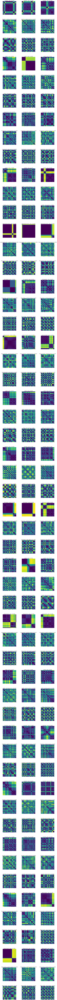

In [19]:
# Número de colunas
num_cols = 3

# Calcular o número total de imagens
num_images = sum(len(row['rows'].split(',')) for _, row in train_value_min_label_sample.iterrows()) * len(predictors)

# Calcular o número de linhas necessárias
num_rows = (num_images + num_cols - 1) // num_cols  # Arredonda para cima

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# Iterador para manter o controle das subplots
img_idx = 0

for i, row in train_value_min_label_sample.iterrows():
    for p in predictors:    
        ids = row['rows'].split(sep=',')
        appliance = row['appliance']
        for id in ids:
            # Carregar a imagem
            image = mpimg.imread(os.path.join('../data/v4', f'window_size_{windows_size_min}', 'train', 'all',f'{id}_{p}.png'))

            # Calcular a posição da subplot
            row_idx = img_idx // num_cols
            col_idx = img_idx % num_cols

            # Exibir a imagem na subplot correspondente
            ax = axs[row_idx, col_idx]
            ax.imshow(image)
            ax.set_title(f'{appliance} - {p} - ID: {id}')
            ax.axis('off')  # Para ocultar os eixos
            
            img_idx += 1

# Ajustar o layout das subplots
plt.tight_layout()  # Ajusta a posição para não sobrepor o título

print('train_value_min')

# Ajustar o layout geral
fig.subplots_adjust(top=0.96)  # Ajusta a posição do título

# Exibir a imagem composta
plt.show()       